# CAM and Object Detection

CS 484 Final Project | by Kevin Guo (k56guo@uwaterloo.ca) and Ben Lin (b48lin@uwaterloo.ca)

## Abstract



## Team Members and Contributions

Kevin Guo: k56guo@uwaterloo.ca
- Implementing model training and testing pipelines
- Preparing the emergency vehicles and Waldo datasets, and experimenting with label noise
- Fine-tuning classification models on emergency vehicles and Waldo datasets
- Writing the conclusion section

Ben Lin: b48lin@uwaterloo.ca
- Implementing CAM heatmap generation for a trained model and target image
- Designing model architecture and training the models
- Fine-tuning classification models on emergency vehicles and Waldo datasets
- Writing the abstract section

## Code Libraries

These are the external libraries essential for our project:

- `torch` and `torchvision`: Standard libraries for ML and CV. We used the predefined ResNet18 and ResNet50 models, as well as their pre-trained weights for the ImageNet dataset. We used the `transformations` submodule for data augmentation.
- `numpy`: Used for performing vectorized operations on arrays and tensors.
- `matplotlib`: Used `pyplot` submodule to display images.
- `tqdm`: Used to create quality-of-life progress bars during model training.
- `cv2` (installed as `opencv-python`): Used to load images, resize images, and apply colormaps.
- `sklearn` (installed as `scikit-learn`): We used the `model_selection.train_test_split` function to partition datasets in a random and stratified manner (i.e. ensures the partition maintains the proportional distribution of each class). We primarily use this function to split datasets into training and testing portions; we also use it to select a portion of the data to which we add label noise.

We also have our own library `model.py` in which we define our model architetures.

In [94]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from sklearn.model_selection import train_test_split

In [95]:
SEED = 1

# Use GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print('Current Device:', device)

Current Device: cpu


## CAM

The following cell displays the CAM 

In [110]:
# Displays CAM and prediction.
#  img:           numpy array with shape (img_height, img_width, img_channels)
#  target_class:  prediction class
def cam(img, model, target_class=1, transform=None):
    model.eval()

    sample_img = transforms.ToTensor()(img)
    if transform != None:
        sample_img = transform(sample_img)
    sample_img = sample_img.unsqueeze(0).to(device)
    model.to(device)
    feats = model.get_features(sample_img).data.cpu().numpy()
    
    # Get prediction probability for target class
    output = model(sample_img)
    logits = F.softmax(output, dim=1).squeeze()
    pred_logit = logits[target_class].item()

    _, nc, h, w = feats.shape
    r = feats.reshape((nc, h*w))

    params = list(model.parameters())
    weight = np.squeeze(params[-2].data.cpu().numpy())

    c = weight[target_class] @ r
    c = c.reshape((h, w))
    c = c - np.min(c)
    c = c / np.max(c) if np.max(c) > 0 else c
    c_i = np.uint8(255 * c)
    c_i = cv2.resize(c_i, (img.shape[1], img.shape[0]))

    heatmap = cv2.cvtColor(cv2.applyColorMap(c_i, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
    
    return heatmap, pred_logit

In [97]:
def show_cam(img, heatmap, figsize=(6,4)):
    img = np.uint8(img)
    
    img_heatmap = np.uint8(0.3 * heatmap + 0.5 * img)

    # Plot original image and superimposed CAM side-by-side
    plt.figure(1, figsize=figsize)
    img_plot = plt.subplot(121)
    img_plot.axis('off')
    img_plot.imshow(img)
    cam_plot = plt.subplot(122)
    cam_plot.axis('off')
    cam_plot.imshow(img_heatmap)
    plt.show()

## Test 1: Pre-Trained ImageNet

Before using our CAM code on our own models, we first test it by generating some CAMs for the pretrained ResNet18 model on the ImageNet dataset.

In [98]:
from mylibs.model import Resnet18

model_default_imagenet = Resnet18()
model_default_imagenet.load_state_dict(torch.load('./models/default_imagenet.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


We will (arbitrarily) focus on the chainsaw class. This class is 491 out of the 1000 ImageNet classes. We will use some arbitrary images selected from the ImageNet validation dataset, as well as a tabby cat image from the Internet, for testing. This is to ensure that demonstration images are not in the training dataset of the model.

In [106]:
IMAGENET_CHAINSAW_CLASS = 491

chainsaws = [
    './examples/imagenet/chainsaw1.JPEG',
    './examples/imagenet/chainsaw2.JPEG'
]

not_chainsaws = [
    './examples/imagenet/cornet.JPEG',
    './examples/imagenet/golf.JPEG',
    './examples/tabby_cat.jpg'
]

In [101]:
# These are the transforms ImageNet uses when preprocessing input images.
IMAGENET_MEAN = [0.485, 0.456, 0.406]     
IMAGENET_STD = [0.229, 0.224, 0.225]
IMAGENET_TRANSFORMS = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((256,256)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

Chainsaw Probability: 87.75302%


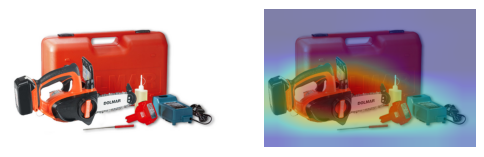

Chainsaw Probability: 89.55557%


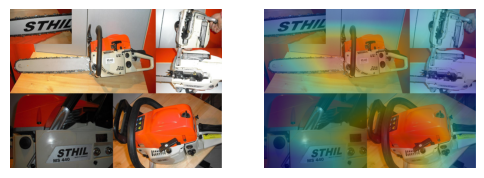

In [112]:
# Produce CAMs for chainsaw images
for im_path in chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    heatmap, logit = cam(im, model_default_imagenet, 
                         IMAGENET_CHAINSAW_CLASS, 
                         IMAGENET_TRANSFORMS)
    print('Chainsaw Probability: {:.5f}%'.format(logit*100))
    show_cam(im, heatmap)

We see that the pre-trained ResNet18 model (unsurprisingly) correctly identifies that these images include chainsaws with high probability. The red regions of the CAM reveal what part of the images contributed the most to this classification: the red/black/silver body of the chainsaw is most relevant. In the second image, both chainsaws are relevant to the classification, so both chainsaws have been "identified" by the model.

Anthropomorphizing the model slightly, the red regions are the ones which the model thinks are most "chainsaw-like", and the blue regions are the ones which the model thinks are least "chainsaw-like".

Chainsaw Probability: 0.00040%


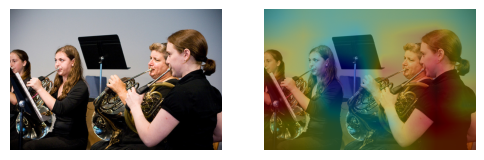

Chainsaw Probability: 0.00119%


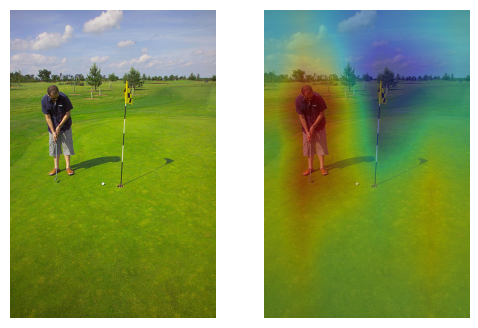

Chainsaw Probability: 0.00076%


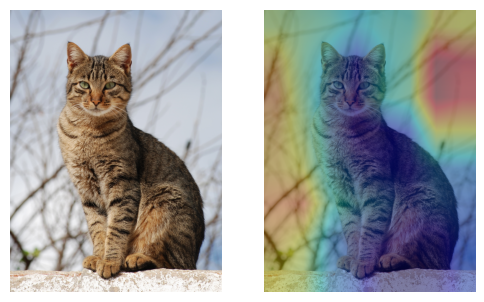

In [113]:
# Produce CAMs for non-chainsaw images
for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    heatmap, logit = cam(im, model_default_imagenet, 
                         IMAGENET_CHAINSAW_CLASS, 
                         IMAGENET_TRANSFORMS)
    print('Chainsaw Probability: {:.5f}%'.format(logit*100))
    show_cam(im, heatmap)

Again, the pre-trained model (unsurprisingly) correctly identifies that these images do not contain chainsaws. The blue regions of the CAMs can be interpreted as the regions that contributed the most to classification as a non-chainsaw.

We can also produce CAMs for any other class. Here are some CAMs for the tabby class:

Tabby Cat Probability: 0.00005%


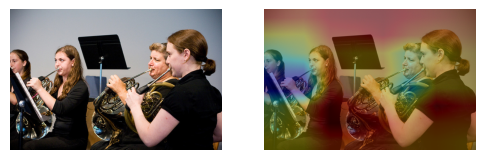

Tabby Cat Probability: 0.00008%


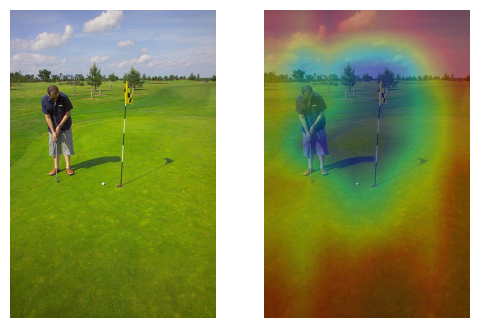

Tabby Cat Probability: 29.61389%


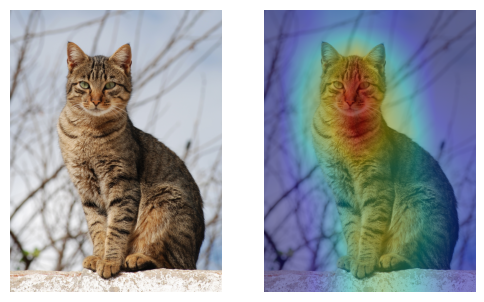

In [121]:
IMAGENET_TABBY_CLASS = 281

for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    heatmap, logit = cam(im, model_default_imagenet, 
                         IMAGENET_TABBY_CLASS, 
                         IMAGENET_TRANSFORMS)
    print('Tabby Cat Probability: {:.5f}%'.format(logit*100))
    show_cam(im, heatmap)

The model correctly classified the first two images as not-tabbies with high confidence, but the last image (the tabby) was classified with lower confidence than expected. We can investigate by peeking at the other logits of the model's classification:

In [132]:
tabby_path = not_chainsaws[-1]
im_raw = cv2.imread(tabby_path)
im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)

sample_img = transforms.ToTensor()(im)
sample_img = IMAGENET_TRANSFORMS(sample_img)
sample_img = sample_img.unsqueeze(0).to(device)

output = model_default_imagenet(sample_img)
logits = F.softmax(output, dim=1).squeeze()
logits.shape

torch.Size([1000])

In [135]:
# For each ImageNet class i = 0, ..., 999, the model predicts that the image
#  belongs to class i with confidence logits[i].

# To interpret the top 5 most probable classifications, we need to convert these
#  class indices to the class names.

imagenet_class_to_idx = {}
with open('./datasets/imagenet_class_to_idx.txt') as dict_file:
    for ln in dict_file.readlines():
        tokens = ln.strip(' {').split(maxsplit=1)
        key = int(tokens[0][:-1])
        val = tokens[1].split(',')[0].strip('\' ,')
        imagenet_class_to_idx[key] = val

# First few ImageNet classes and their names:
print(list(imagenet_class_to_idx.items())[:10])

[(0, 'tench'), (1, 'goldfish'), (2, 'great white shark'), (3, 'tiger shark'), (4, 'hammerhead'), (5, 'electric ray'), (6, 'stingray'), (7, 'cock'), (8, 'hen'), (9, 'ostrich')]


In [147]:
print('Top 5 Model Predictions:')
sorted, indices = logits.sort(descending=True)
for i in range(5):
    c = indices[i].item()
    l = sorted[i].item()
    print('{:15} {:.2f}%'.format(imagenet_class_to_idx[c], l*100))

Top 5 Model Predictions:
Egyptian cat    38.62%
tabby           29.61%
tiger cat       26.37%
lynx            1.10%
plastic bag     0.89%


So we see that the model does correctly classify the image as a cat; the model is unsure about what type of cat is in the image.

To wrap up our first experiment, we can take a look at the CAM for the Egyptian cat class to speculate at why the model thinks this cat is an Egyptian cat:

Egyptian Cat Probability: 38.62092%


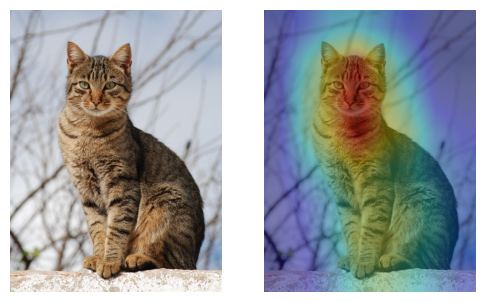

In [146]:
IMAGENET_EGYPTIAN_CAT_CLASS = 285

heatmap, logit = cam(im, model_default_imagenet, 
                    IMAGENET_EGYPTIAN_CAT_CLASS, 
                    IMAGENET_TRANSFORMS)
print('Egyptian Cat Probability: {:.5f}%'.format(logit*100))
show_cam(im, heatmap)

We see that the CAM looks very similar to the CAM for the Tabby class. The face of the cat is highlighted slightly redder in the Egyptian cat CAM, so perhaps the model is picking up on some facial features that are more similar to those of Egyptian cats in its training set.

Mild disclaimer: We don't know much about cat identification or cat features; we simply found this image by searching "tabby cat pictures" on Google Images.

## Test 2: Waldo

For our next experiment, we attempt to use CAMs to play Where's Waldo (also known as Where's Wally)! We train a classifier that identifies whether the cartoon character Waldo is present in an image. We hope that if the model successfully learns the features of Waldo, then the CAMs will indicate the location of Waldo in the image strongly in red. The features of Waldo should contribute the strongest to determining whether Waldo is present or not in an image.

(64, 64, 3)


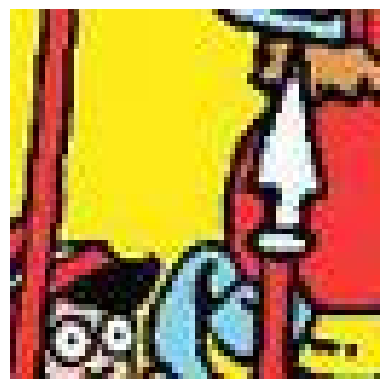

In [ ]:
# Show first image
image = cv2.imread('./datasets/waldo/labelled/waldo/sz64_1_4_6.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(image.shape)
plt.axis('off')
plt.imshow(image)
plt.show()

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(size=64),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.1, hue=0.05, saturation=0.1),
    transforms.RandomHorizontalFlip()
])

In [ ]:
TRAIN_SIZE = 0.7

dataset = torchvision.datasets.ImageFolder('datasets/waldo/labelled', transform)

train_idx, val_idx = train_test_split(np.arange(len(dataset)),
                                           train_size=TRAIN_SIZE, 
                                           random_state=SEED, 
                                           stratify=dataset.targets)

train_data = torch.utils.data.Subset(dataset, train_idx)
val_data = torch.utils.data.Subset(dataset, val_idx)

print('Dataset Size:', len(dataset))
print('Train Data Size:', len(train_data))
print('Validation Data Size:', len(val_data))

Dataset Size: 7027
Train Data Size: 4918
Validation Data Size: 2109


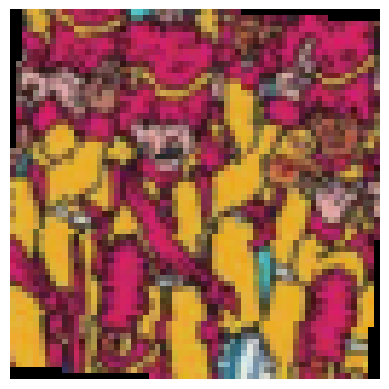

Label: 0


In [ ]:
# Some quick sanity checks
for img, label in dataset:
    plt.axis('off')
    plt.imshow(img.permute(1,2,0))
    plt.show()
    print('Label: {}'.format(label)) # Emergency vehicles have label 0; non-emergency have label 1
    break

In [ ]:
n_data = len(dataset)
n_waldo = sum(label for label in dataset.targets)
n_notwaldo = n_data - n_waldo
print('Waldo Images:', n_waldo)
print('Not Waldo Images:', n_notwaldo)

Waldo Images: 92
Not Waldo Images: 6935


In [ ]:
# Create dataloaders
BATCH_SIZE = 50

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)

In [88]:
from mylibs.model import CNNClassifierDeep
model_waldo = CNNClassifierDeep(num_classes=2)
model_waldo.load_state_dict(torch.load('./models/waldo.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [89]:
im_paths = [
    './examples/waldo/notwaldo/sz64_1_0_3.jpg',
    './examples/waldo/notwaldo/sz128_6_4_2.jpg',
    './examples/waldo/notwaldo/sz256_21_2_1.jpg',
    './examples/waldo/waldo/sz64_4_2_11.jpg',
    './examples/waldo/waldo/sz128_9_0_6.jpg',
    './examples/waldo/waldo/sz256_16_2_0.jpg',
    #'./examples/waldo/original-images/9.jpg',
    #'./examples/waldo/original-images/10.jpg',
    #'./examples/waldo/original-images/11.jpg'
]

Probability: 41.21419%


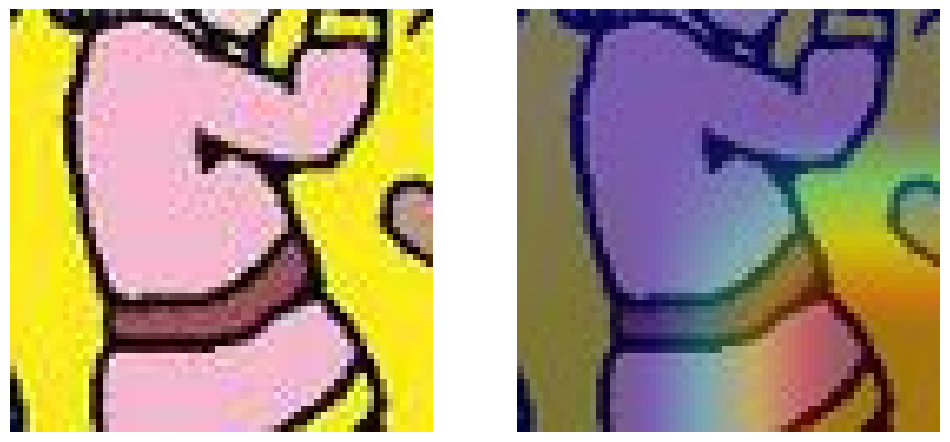

Probability: 45.97744%


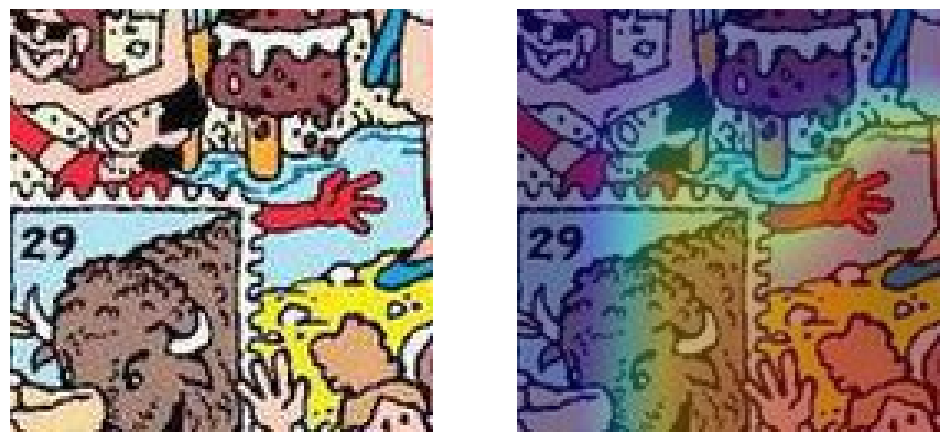

Probability: 51.44038%


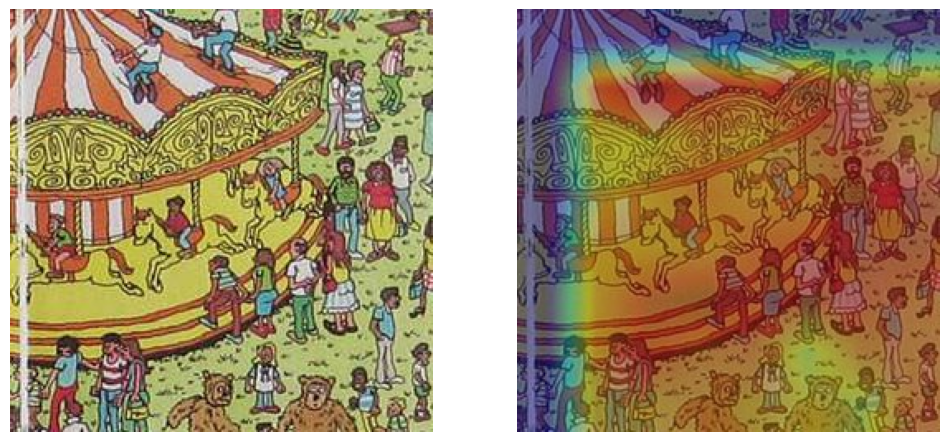

Probability: 40.68190%


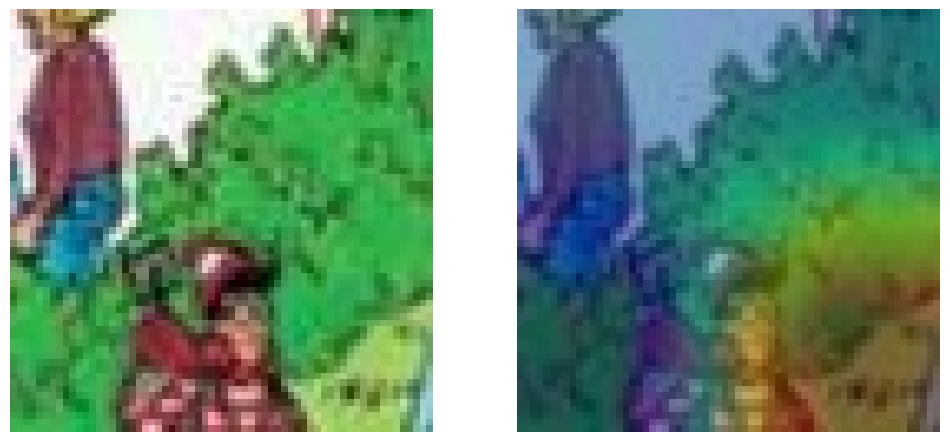

Probability: 46.73132%


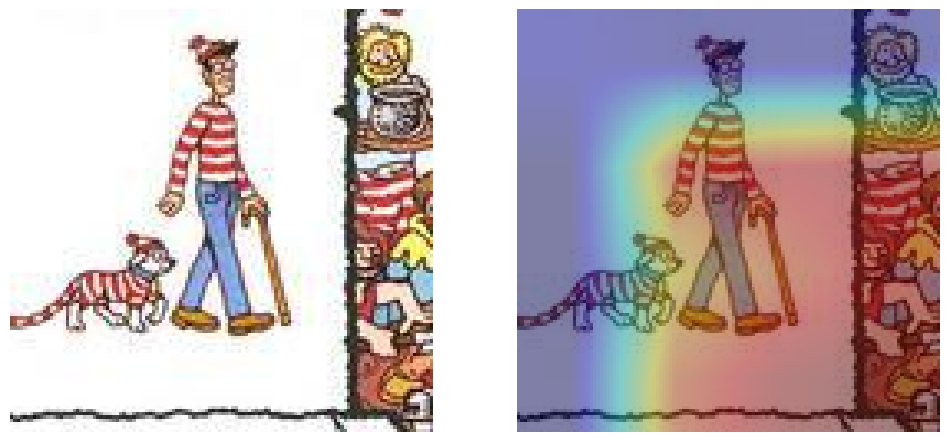

Probability: 57.20405%


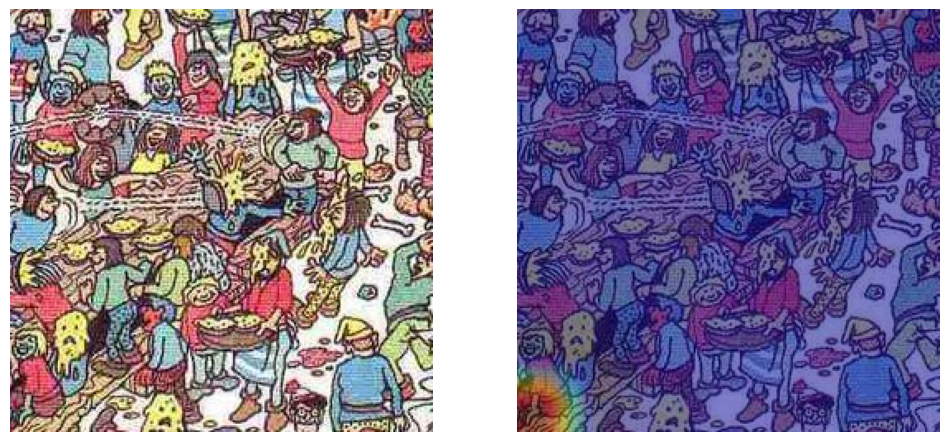

In [90]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_waldo, target_class=1)

## Test 2: Emergency Vehicles

In [85]:
from mylibs.model import CNNClassifier

model_emergency_vehicles = CNNClassifier(num_classes=2)
model_emergency_vehicles.load_state_dict(torch.load('./models/2024-04-22-20-49-emergency_vehicles.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [86]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg',
    './examples/emergency_vehicles/2317.jpg',
]

Probability: 99.99981%


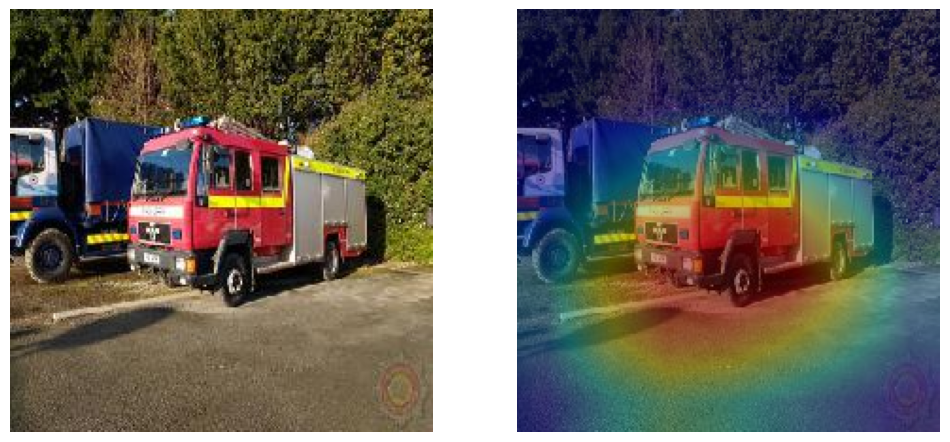

Probability: 99.99995%


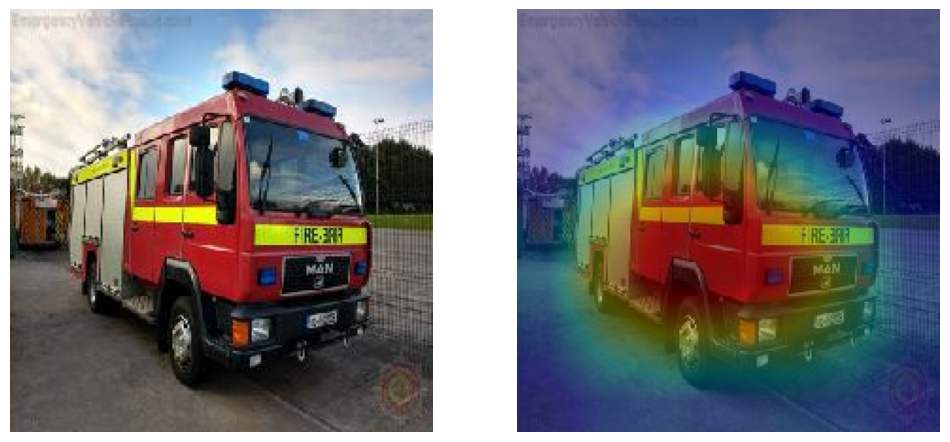

Probability: 100.00000%


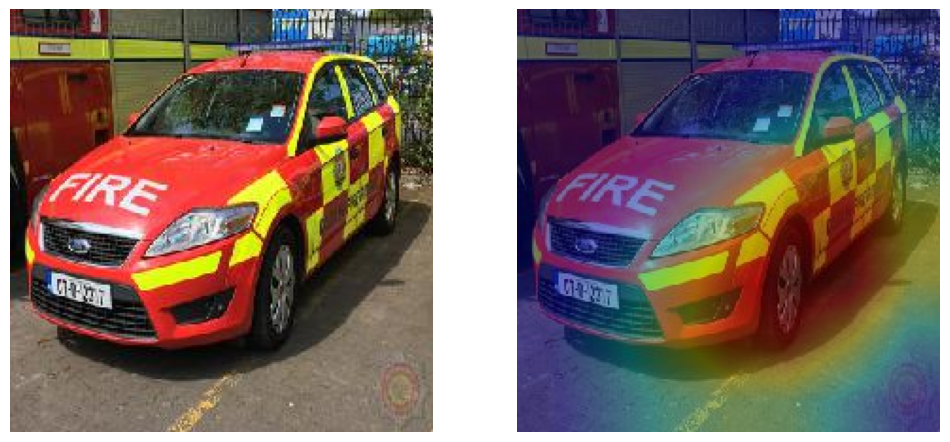

Probability: 5.28702%


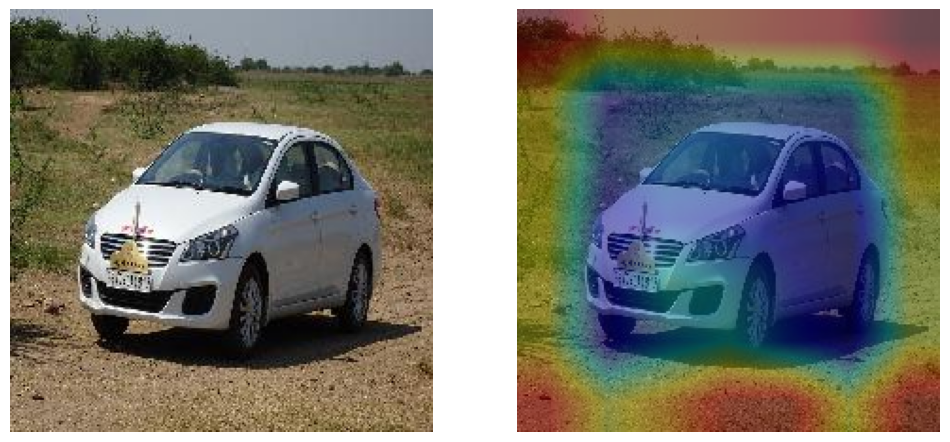

Probability: 10.75368%


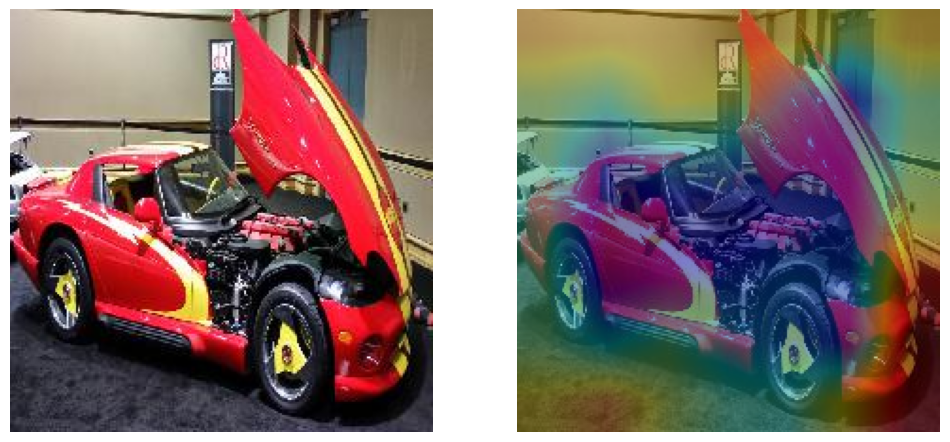

Probability: 7.17148%


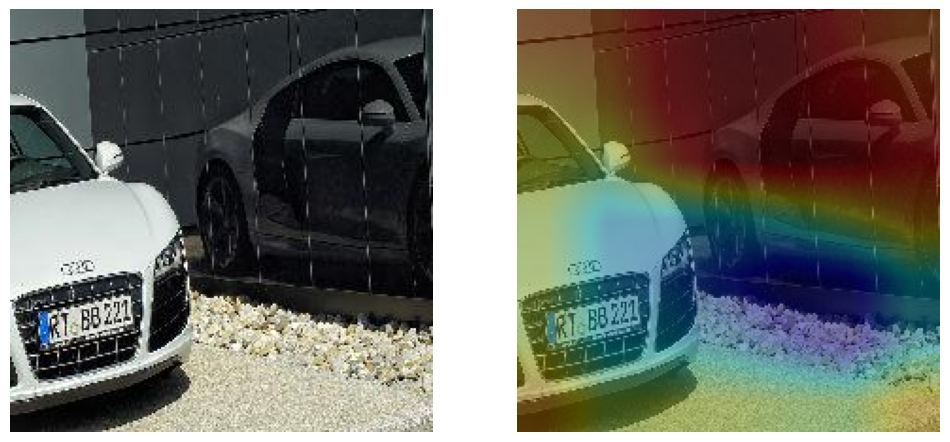

In [87]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_emergency_vehicles, target_class=0)

In [91]:
from mylibs.model import CNNClassifier

model_emergency_vehicles_noisy = CNNClassifier(num_classes=2)
model_emergency_vehicles_noisy.load_state_dict(torch.load('./models/emergency_vehicles_noisy-5percent.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [92]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg',
    './examples/emergency_vehicles/2317.jpg',
]

Probability: 99.93698%


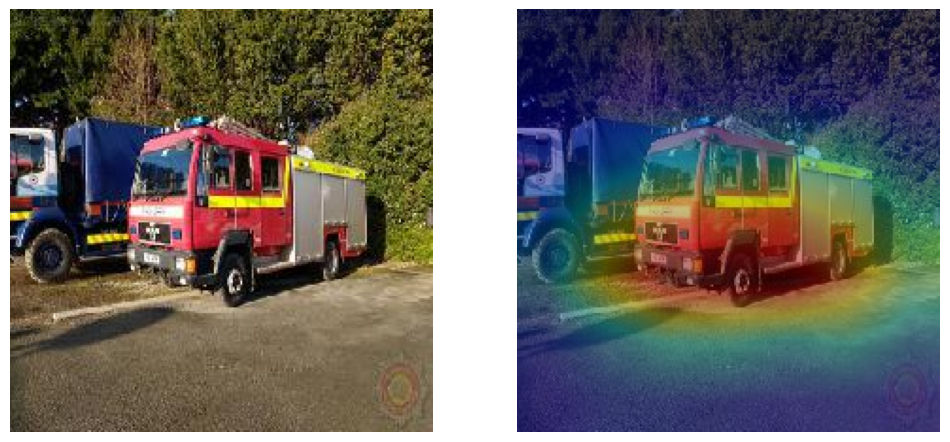

Probability: 99.77521%


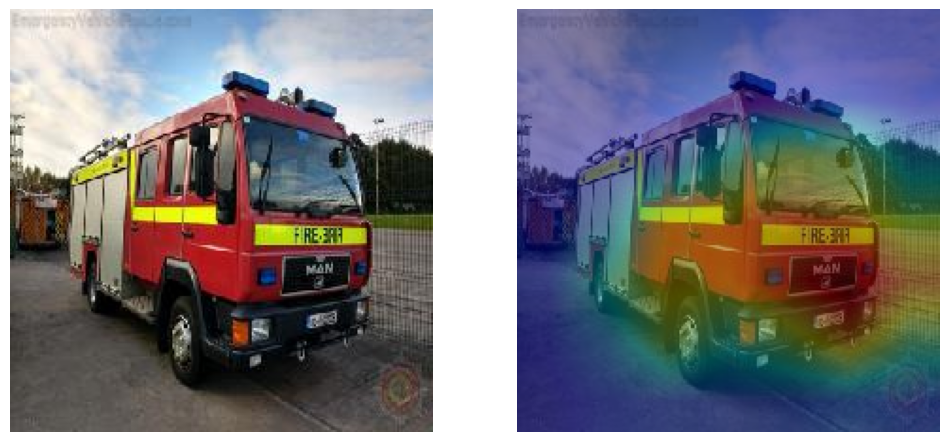

Probability: 99.76319%


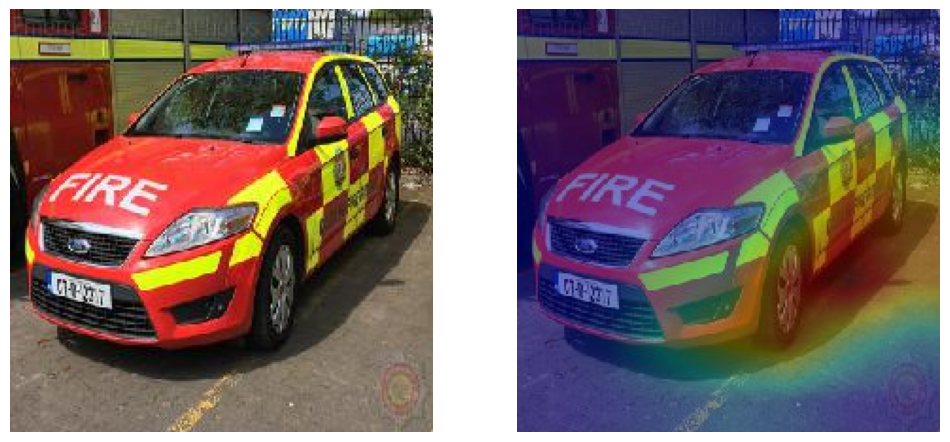

Probability: 63.47711%


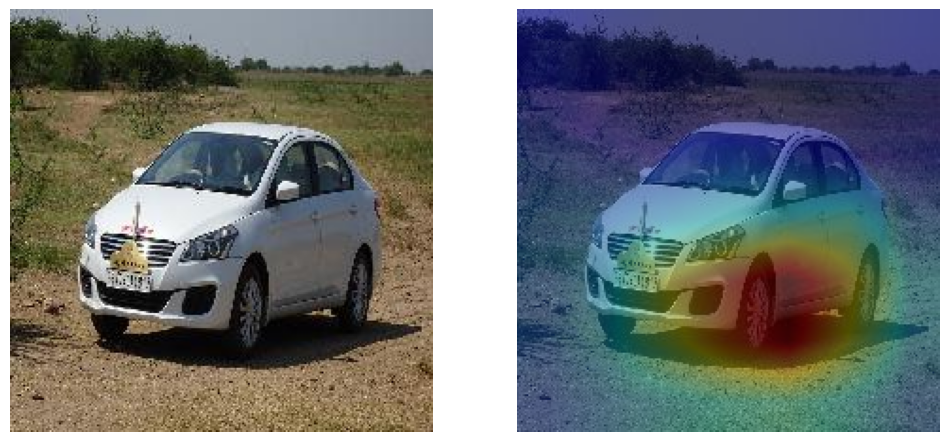

Probability: 8.23828%


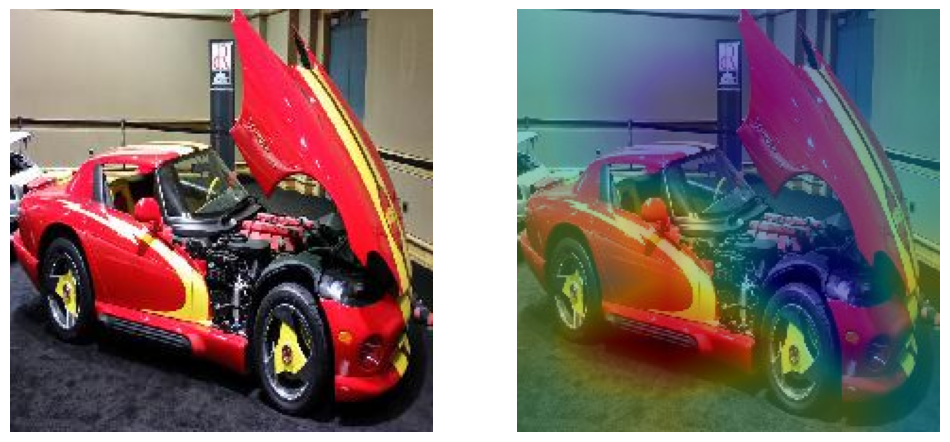

Probability: 1.17438%


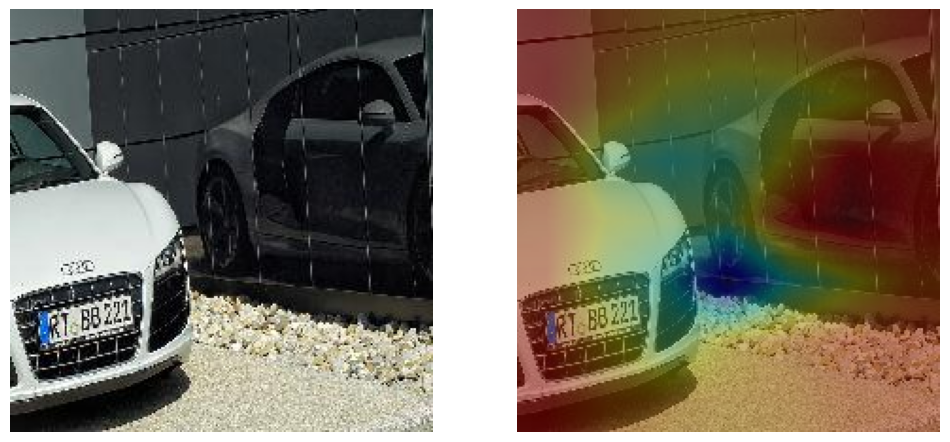

In [93]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_emergency_vehicles_noisy, target_class=0)

## Next Steps

## Conclusion